In [ ]:
# --- IMPORTS ---
import pandas as pd              # Práca s tabuľkami (DataFrame)
import numpy as np               # Matematika a polia
import matplotlib.pyplot as plt  # Základné grafy
import seaborn as sns            # Krajšie štatistické grafy
import scipy.stats as stats      # Štatistické testy (T-testy, ANOVA...)
import statsmodels.api as sm     # Pokročilá štatistika (Regresia)
import statsmodels.formula.api as smf # R-style formuly pre regresiu

# Nastavenie dizajnu grafov
sns.set_theme(style="whitegrid", palette="muted")
%matplotlib inline

print("✅ Libraries successfully loaded!")

In [ ]:
try:
    df = pd.read_csv("lifestyle.csv", sep=";")
    print("✅ Data successfully loaded.")
except FileNotFoundError:
    print("ERROR: File not found.")

df.head()

### Intervalovy odhad (Interval spoľahlivosti / Confidence Interval):

Je to interval skonštruovaný z **výberových dát** tak, že ak by sme tento proces výberu a výpočtu opakovali mnohokrát, $100(1-\alpha)\%$ takto skonštruovaných intervalov by obsahovalo skutočný populačný parameter.
* Kolík stojí a ja hádžem kruhy. Mám takú dobrú techniku (95 %), že zo 100 hodov trafím kolík 95-krát."

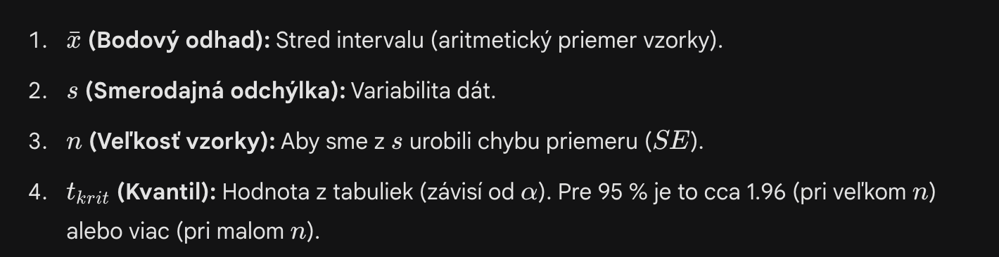
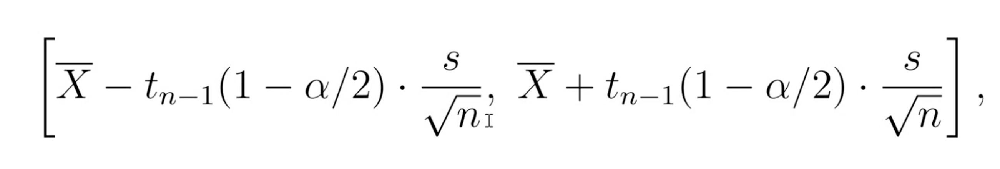

1. vezmi nahodny vyber X, napr. 50 ludi
2. spocitaj priemernu hodnot nahodneho vyberu X na urcitom stlpci, napr. Heart Rate
3. spocitaj SD
4. n = pocet pozorovani
5. dosad do vzorca - zisti, kde sa asi parameter populacie bude nachadzat
---

* Na okamzik sa tvar ze **cela populacia je 374**.

* Teraz skusime vybrat **n=50 nahodnych ludi**.

  
Overime, ci nas priemer 'Heart Rate' na nahodnom vybere X naozaj patri do nami vypocitaneho intervaloveho odhadu.

* 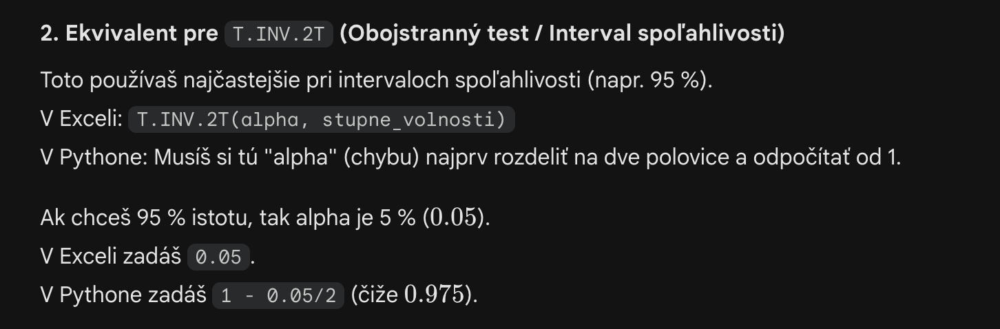

In [ ]:
# n
n=50

# Nahodny vyber:
# Ak chceš, aby ti vždy vyšli tie isté "náhodné" čísla (kvôli reprodukovateľnosti), použi random_state: df['Heart Rate'].sample(n=50, random_state=42)
sample = df['Heart Rate'].sample(n=n, random_state=42)

# X - bodovy odhad
x = sample.mean()

# SD - smerodatna odchylka
std = sample.std()

# alpha
alpha = 0.05

# Ak chcem 95% istotu, tak: 1-alpha/2 = 0.975

# Excel: =T.INV(0.975, len(sample) -1 )
t_krit = stats.t.ppf(1-alpha/2, df=len(sample)-1)
print(t_krit)

In [ ]:
# 2. Štandardná chyba (Standard Error)
sem = std / np.sqrt(n)

# 3. Výpočet hraníc
lower_boundary = x - t_krit * sem
upper_boundary = x + t_krit * sem

# Skutocny priemer "nasej celej populacie"
x_all = df['Heart Rate'].mean()

print(f"Priemerný tep/min vzorky: {x:.2f}")
print(f"S 95% istotou je skutočný priemer medzi {lower_boundary:.2f} a {upper_boundary:.2f} tepov za minutu.")
print(f"Skutocny Priemerný tep/min populacie je: {x_all:.2f}")


### Testovanie normality
* QQ graf (Quantile Quantile Graph)+
* * Na jednej ose je overene normalove rozdelenie a na druhej ose je nejaka velicina, o ktorej nevieme ake ma rozdelenie, konkretne body z dat
  * Ak sa body mapuju na priamku, tak pravdepodobne data su z normaloveho rozdelenia
* Shapiro-Wilk test

In [ ]:
stat, p_val = stats.shapiro(df['Heart Rate'])
print(f"Shapiro-Wilk test: p-hodnota = {p_val:.4f}")
if p_val > 0.05:
    print("✅ Dáta majú normálne rozdelenie (nezamietame H0).")
else:
    print("❌ Dáta NEMAJÚ normálne rozdelenie (zamietame H0).")

In [ ]:
# Vytvoríme plochu pre graf
plt.figure(figsize=(8, 6))

# QQ Plot pre Dĺžku spánku
# line='s' znamená, že červená čiara sa prispôsobí priemeru a odchýlke tvojich dát
sm.qqplot(df['Age'], line='s')

plt.title('QQ Plot: Test normality pre Vek')
plt.show()

In [ ]:
# Excel: NORM.S.INV
z_score = stats.norm.ppf(0.95)
print(f"Z-skóre pre 95%: {z_score:.4f}")

Funkcia stats.norm.ppf (v Exceli NORM.S.INV) je matematicky **inverzná distribučná funkcia štandardného normálneho rozdelenia**.

* V štatistike sa jej odborne hovorí **Kvantilová funkcia** (Percent Point Function).
* 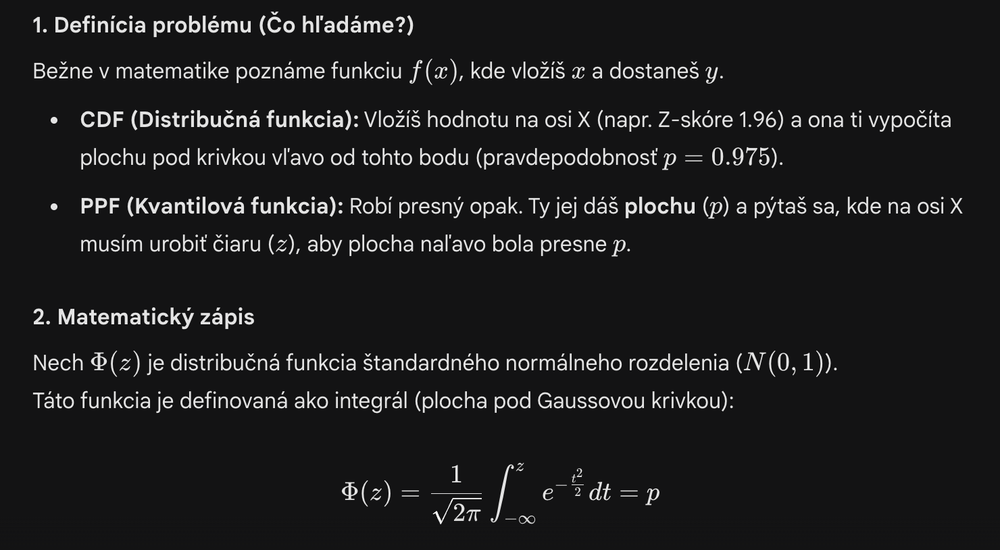
* 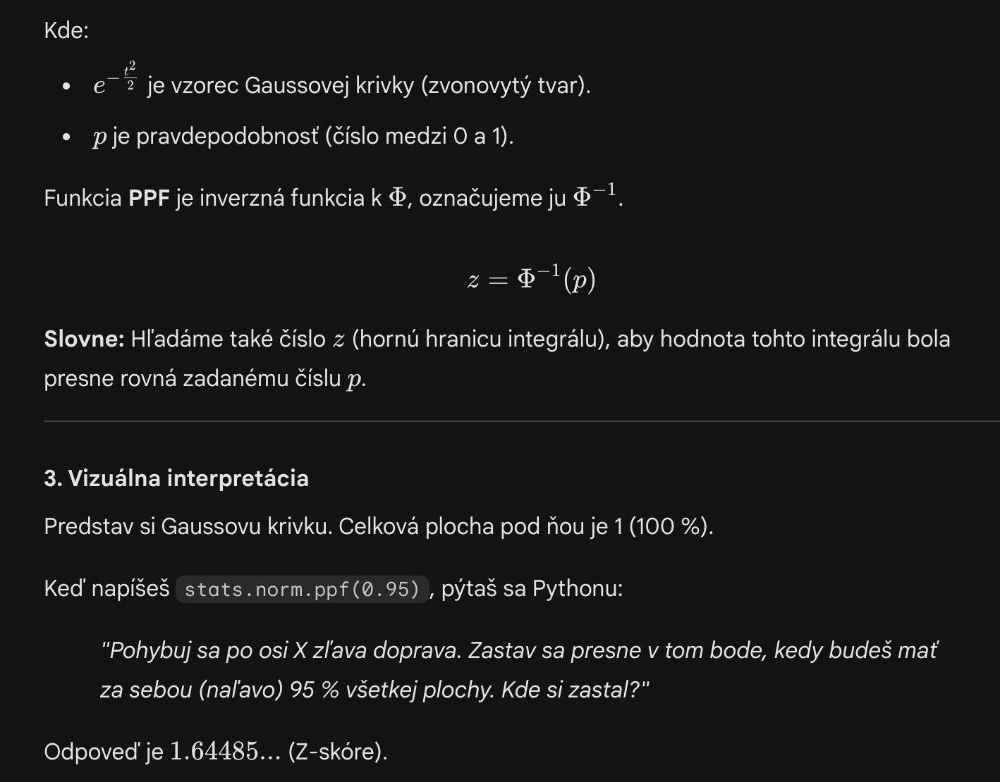

#### Excel navod na QQ graf
1. Vyber si stlpec, na ktorom testujes, napr. Age
2. Zorad od najmensieho po najvacsi
4. Vytvor novy Stlpec I - hodnoty od 1 po n+1 = Rank column
5. Vytvor Druhy stlpec pravdepodobnosti K, ktory bude mat Ki = Ii / n+1 (nadobudne hodnoty medzi 0 a 1) zacne skoro od 0 a postupne to porastie az skoro ku 1
   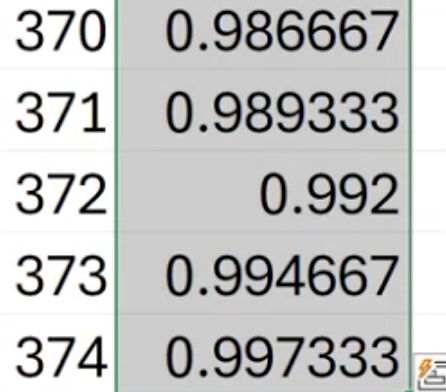
6. Vytvor Treti stlpec NORM - PPF (Gaussovo rozdelenie) - **EXCEL=norm.s.inv(IN: Ki)** je v pythone stats.norm.ppf
   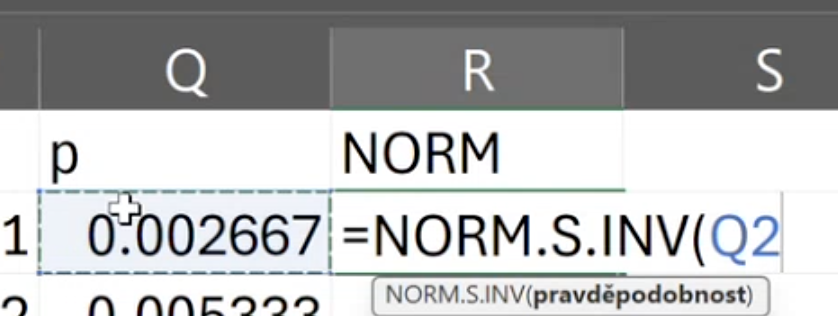

### QQ Graph manually in Python

In [ ]:
# Sort data
age_col = df['Age']
sorted_age = np.sort(age_col)

# Calculate Rank (Poradie) and Probability p
# Formula: (i - 0.5) / n is standard for QQ graphs but we use p_i / (n+1)
n = len(sorted_age)

# I column = Rank
rank = np.arange(1, n+1) 
# K column = Probability
probability = rank / (n+1)

# Calculate theorethical_quantiles (Z-score) = NORM.S.INV
theorethical_quantiles = stats.norm.ppf(probability)

# PLOT GRAPH
plt.figure(figsize=(8, 8))

# Dots (X = Theorethical z score, Y = Real data)
plt.scatter(theorethical_quantiles, sorted_age, color='blue', alpha = 0.6, label='Age')

# Add regression line (spojnica trendu) to see the linearity, Excel: Add trendline
z = np.polyfit(theorethical_quantiles, sorted_age, 1) # Linear regression
p = np.poly1d(z)
plt.plot(theorethical_quantiles, p(theorethical_quantiles), "r--", label="Ideal normality")

plt.title('Manuálny QQ Graf (Metóda Excel = NORM.S.INV)')
plt.xlabel('Teoretické Kvantily (Výsledok NORM.S.INV)')
plt.ylabel('Reálne dáta (Age)')
plt.legend()
plt.grid(True)
plt.show()

### Notes
**z = np.polyfit(theorethical_quantiles, sorted_age, 1)** # Linear regression
* Funkcia: **"Polynomial Fit"**. Hľadá matematickú rovnicu krivky, ktorá **najlepšie pasuje na tvoje body** (Metóda najmenších štvorcov).
* Parametre:
* theoretical_quantiles (os X): Tvoje vypočítané Z-skóre.
* sorted_data (os Y): Tvoje skutočné dáta (Age).
* 1: Stupeň polynómu. Číslo 1 znamená, že hľadáme priamku (lineárna rovnica $y = ax + b$).
  Ak by si dala 2, hľadá parabolu ($x^2$).
* **Výstup (z)**: Vráti dve čísla – sklon čiary (slope) a posun (intercept). **Napr. [4.2, 70.5].**

**np.poly1d(z)**

* Funkcia: **"Polynomial 1-Dimension"**. Toto je pomocník, ktorý z tých dvoch čísel (z) **vyrobí skutočnú funkciu p**.
* Čo to robí: Odteraz môžeš používať **p ako funkciu**. Keď napíšeš $p(2)$, ono to vypočíta $4.2 \cdot 2 + 70.5$.

**plt.plot(x, y, "r--")** = **plt.plot(theorethical_quantiles, p(theorethical_quantiles), "r--", label="Ideal normality")**


* Funkcia: Nakreslí čiaru.
* Parametre:
* x: theoretical_quantiles (Os X).
* y: p(theoretical_quantiles) (Os Y). Tu sme použili našu funkciu p, aby vypočítala ideálne Y pre každé X. Tým vznikne dokonale rovná čiara.
* "r--": Štýl čiary. r = red (červená), -- = dashed (prerušovaná čiara).

## Testovanie hypotez

### 1 vyberovy T-Test
* Parametricky test, kde data patria do normaloveho rozdelenia, porovnavame voci strednej hodnote E(X)
* Zmyslom je, ze ak mame T rozdelenie, tak nam ide o to zistit, ci T statistika (T vypocitam), je blizko 0 alebo nie je blizko 0
* Ak je blizko 0, tak realny priemer X a nami  odhadnuta hodnota mi_0 su skoro zhodne a teda H0 hypotezu nemozeme zamietnut.
* To ci je to blizko 0 nam urci tabulkova hodnota --> T > tn-1(1-alpha)
* Nas priklad: stredna hodnota E(X) v populacii nasho vyberu Blood Pressure Diastolic = 80 (mi)
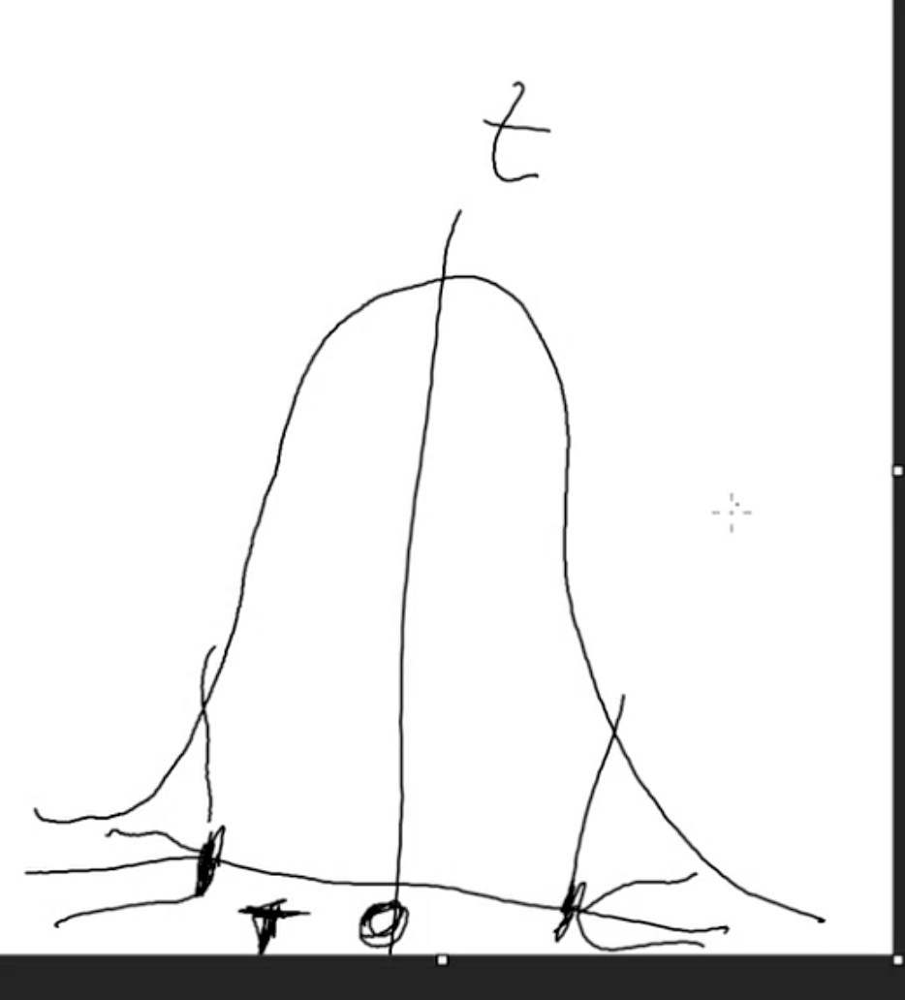

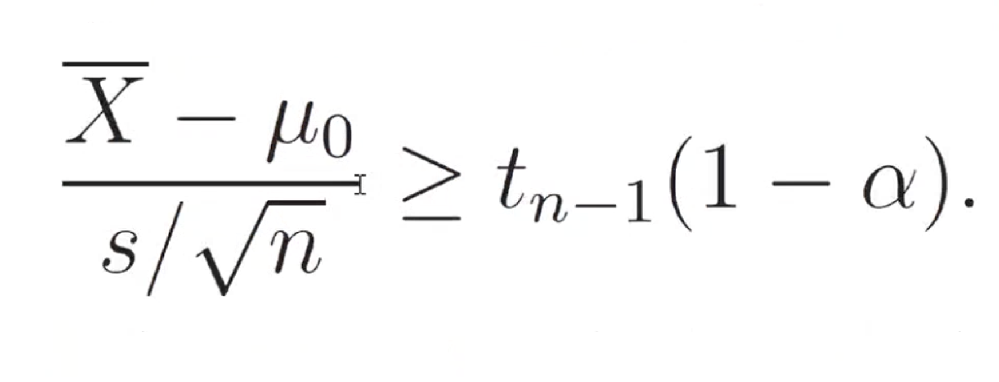
* X bodovy priemer vyberu
* mi_0: nami vybrane cislo (testove kriterium)
* s = STD zo suboru
* n: pocet pozorovani

In [ ]:
blood_data = df['BPd']

# mi_0
krit = 80

# n
n = len(blood_data)

# Mean
bpd_mean = blood_data.mean()
bpd_mean

In [ ]:
# STD
bpd_sd = blood_data.std()
bpd_sd

In [ ]:
import math

ttest = (bpd_mean - krit) / (bpd_sd / math.sqrt(n))
ttest

In [ ]:
alpha = 0.05 # 95% hladina vyznamnosti
degrees_of_freedom = n-1 # stupen volnosti

# Excel: T.INV(0.95, n-1)
# Hladame bod, pod ktorym je 95% plochy, obojstranna varianta: 1 - alpha/2 = 0.975
t_crit = stats.t.ppf(1 - alpha/2, degrees_of_freedom)
t_crit

Vysledkom t_crit je 1.966 -> Ak nase testovacie kriterium **T** je v rozmedzi **(-1.966, +1.966)**, tak to znamena, ze nami realna namerana hodnota priemeru je blizko nami stanovenej hodnote mi_0=80.

* T = 14.594 a t_crit = 1.966 -> **ZAMIETAM H0** E(X) diastolickeho tlaku je rozhodne viac ako 80

### 1 vyberovy T-Test pomocou kniznice

In [ ]:
def deny_h0(p_val):
    if p_val < 0.05:
        print(f"E(X) is statistically differrent. Deny H0. The p_val is: {p_val:.4e}")
    else:
        print(f"We cannot deny H0. The p_val is: {p_val:.4e}")

In [ ]:
t_stat, p_val = stats.ttest_1samp(blood_data, popmean=80)

print(f"T-štatistika: {t_stat:.4f}")
print(f"P-hodnota: {p_val:.4e}")

deny_h0(p_val)

### 2 vyberovy T-test
* 2 nezavisle populacie (napr. Gender)
* 1. krok: Testujeme zhodu rozptylu, vacsi rpzptyl / mensi rozptyl a ak su podstatne vacsie ako 1 tak zamietame ze su si rovne - Ak ANO: test1, ak NIE: test2
  2. 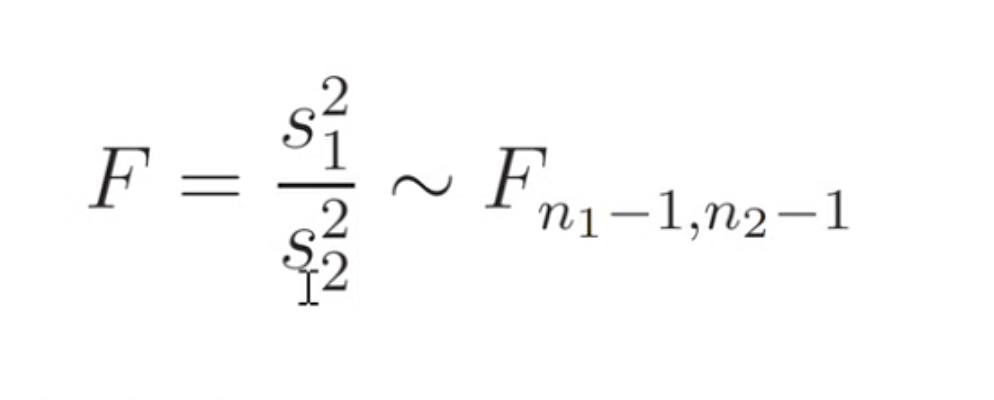
  3. 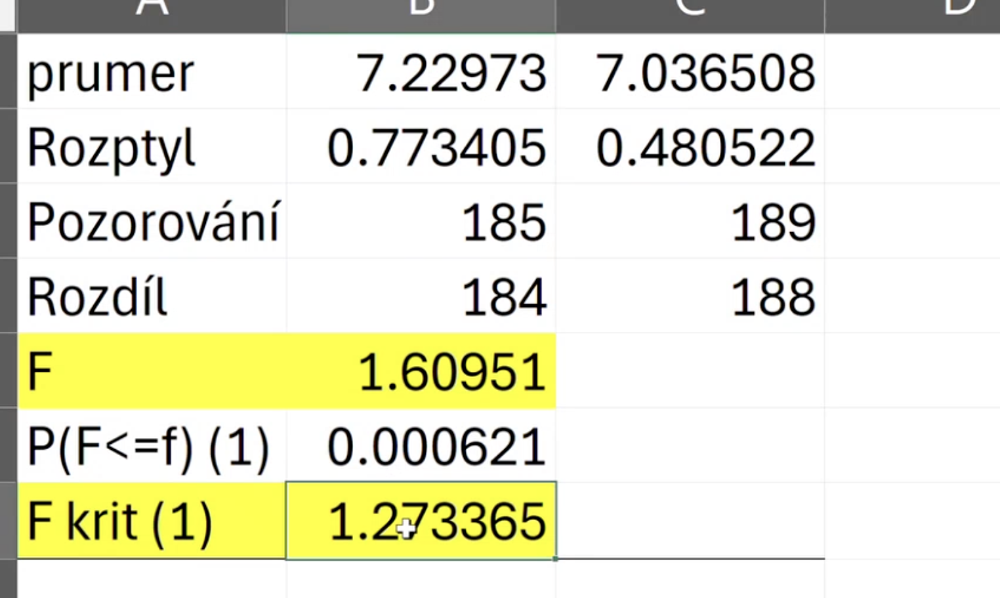
     Podla vysledku z prveho kroku aplikuj vhodny test - nase data nemaju zhodny rozptyl
* porovname dlzku spanku muzov a zien
* Rovnake rozptyly
  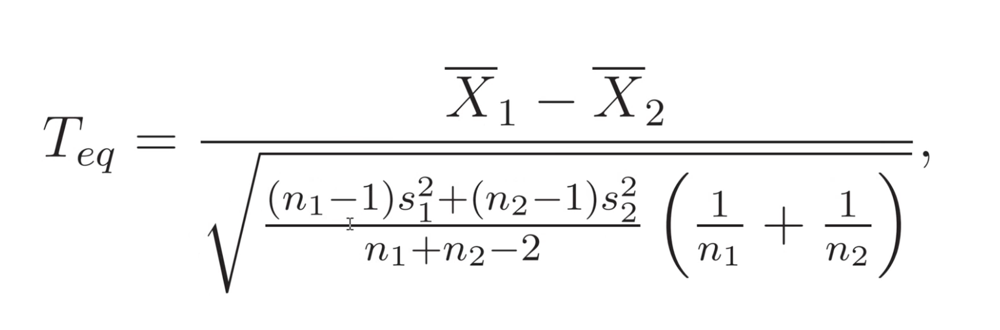
* Rozdielne rozptyly
* 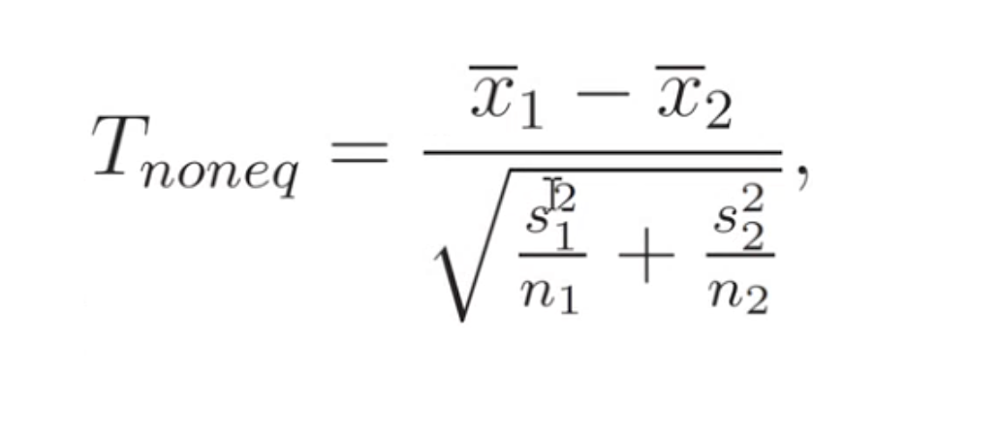

In [ ]:
muzi = df[df['Gender'] == 'Male']['Sleep Duration']
zeny = df[df['Gender'] == 'Female']['Sleep Duration']

# Parametrický test (T-test)
t_stat, p_ttest = stats.ttest_ind(muzi, zeny)

print(f"Priemer Muži: {muzi.mean():.2f} h, Ženy: {zeny.mean():.2f} h")
print(f"T-test p-hodnota:      {p_ttest:.4f}")
deny_h0(p_ttest)

Podla p-hodnoty vidime, ze p_val < 0.05 a teda **zamietam H0**
* **H0**: E(X) spankov u muzov je rovna E(X) spankov u zien a zeny spia vyznamne dlhsie ako muzi

### Priklad:
Porovnaj Physical Activity medzi Nurse a Teacher

In [ ]:
nurse = df[df['Occupation'] == 'Nurse']['Physical Activity Level']
teacher = df[df['Occupation'] == 'Teacher']['Physical Activity Level']

# Parametricky 2 vyberovy T-test
t_stat, p_ttest = stats.ttest_ind(nurse, teacher)

print(f"Priemer nurse: {nurse.mean():.2f} h, teacher: {teacher.mean():.2f} h")
print(f"T-test p-hodnota:      {p_ttest:.4e}") # e-25 znamená, že desatinnú čiarku musíš posunúť o 25 miest doľava.
deny_h0(p_ttest)

**Zamietam H0** Stredne hodnoty physical activity ucitieliek a sestriciek je vyznamne rozdielna a z priemeru vidime, ze sestricky maju vacsi.

@TODO PR 1.1 
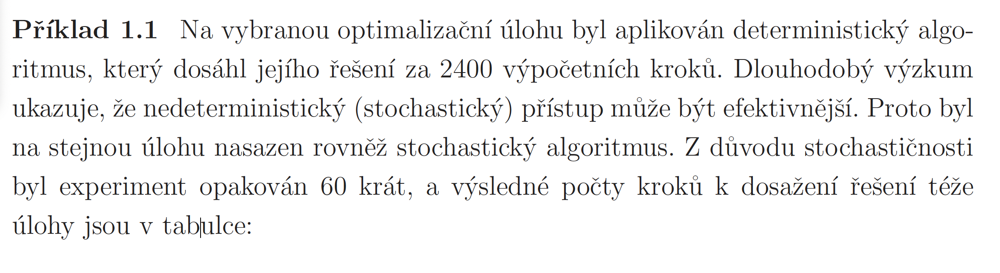

2622 2906 3816 1371 2812 1058 1749 2262 3992 1841 1200 2895
1675 4512 2530 2182 3044 2510 3087 3852 1220 1285 3984 2588
2232 2727 1741 2742 1932 3790 1548 1085 899 2269 2804 1336
3457 2525 1933 2307 2821 2333 2523 1122 1405 2661 1828 788
2018 1400 2130 635 1419 3275 2767 957 2594 1413 3124 3923

In [ ]:
stochastic_measurments = [
    2622, 2906, 3816, 1371, 2812, 1058, 1749, 2262, 3992, 1841, 1200, 2895, 
    1675, 4512, 2530, 2182, 3044, 2510, 3087, 3852, 1220, 1285, 3984, 2588, 
    2232, 2727, 1741, 2742, 1932, 3790, 1548, 1085, 899, 2269, 2804, 1336, 
    3457, 2525, 1933, 2307, 2821, 2333, 2523, 1122, 1405, 2661, 1828, 788, 
    2018, 1400, 2130, 635, 1419, 3275, 2767, 957, 2594, 1413, 3124, 3923
]

df2 = pd.DataFrame(stochastic_measurments, columns=["steps_count"])

# mi_0 = 2400: H0 bude to, ze stochasticky pristup ma rovnaku efektivitu ako deterministicky pristup a teda ma rovanky pocet vypocetnych krokov
mi0 = 2400
n_steps = len(stochastic_measurments)
degrees_of_freedom = n_steps - 1

# Calculate mean
steps_mean = df2['steps_count'].mean()
print("mean steps_count: ", steps_mean)

# Calculate STD
steps_std = df2['steps_count'].std()
print("STD steps_count: ", steps_std)

ttest_steps = (steps_mean - mi0) / (steps_std / math.sqrt(n_steps))
print("T-test value ", ttest_steps)

t_crit_steps = stats.t.ppf(1 - alpha/2, degrees_of_freedom)
t_crit_steps
print("T-test value ", t_crit_steps)


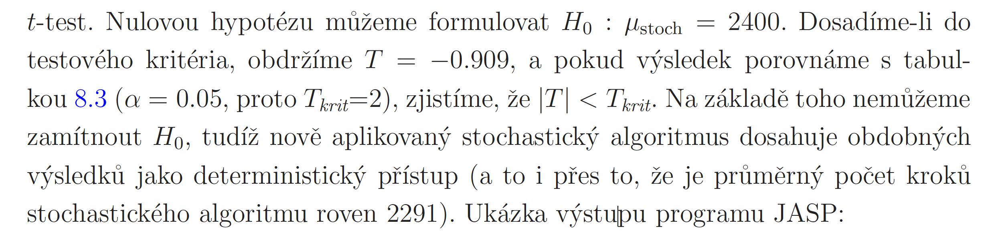

## Independent 2 sample test

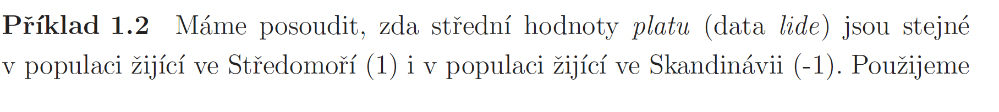

In [ ]:
!pip install xlrd


In [ ]:
file_path = 'data_ku3.xls'

try:
    df = pd.read_excel(file_path)
    print("Data has been successfuly loaded.")
    print(df.head())
    
    # Show Data types
    print(df.info())

except FileNotFoundError:
    print("Filepath error.")

In [ ]:
group_a = df['x']
group_b = df['Y']

# Levene variance equality of 2 groups
stat_lev, p_lev = stats.levene(group_a, group_b)
print(f"Leveneho test p-hodnota: {p_lev:.4e}")
deny_h0(p_lev)

# T-test, if p > 0.05 then equal_variances=True -> same variances, otherwise False
equal_variances = p_lev > 0.05

t_stat, p_val = stats.ttest_ind(group_a, group_b, equal_var=equal_variances)

print(f"T-stat: {t_stat:.4f}")
print(f"P-value of the test: {p_val:.4e}")

deny_h0(p_val)


In [ ]:
plt.figure(figsize=(12, 6))

# x = Kategória (napr. 'Occupation', 'Gender', 'BMI Category', 'Sleep Disorder')
# y = Číslo (napr. 'Sleep Duration', 'Quality of Sleep', 'Heart Rate', 'Daily Steps')

plt.boxplot([df['x'], df['Y']], tick_labels=['x', 'Y'])

plt.xticks(rotation=0)
plt.title('Stredne hodnoty dat')
plt.grid(True, axis='y', linestyle='--', alpha=0.2)
plt.show()

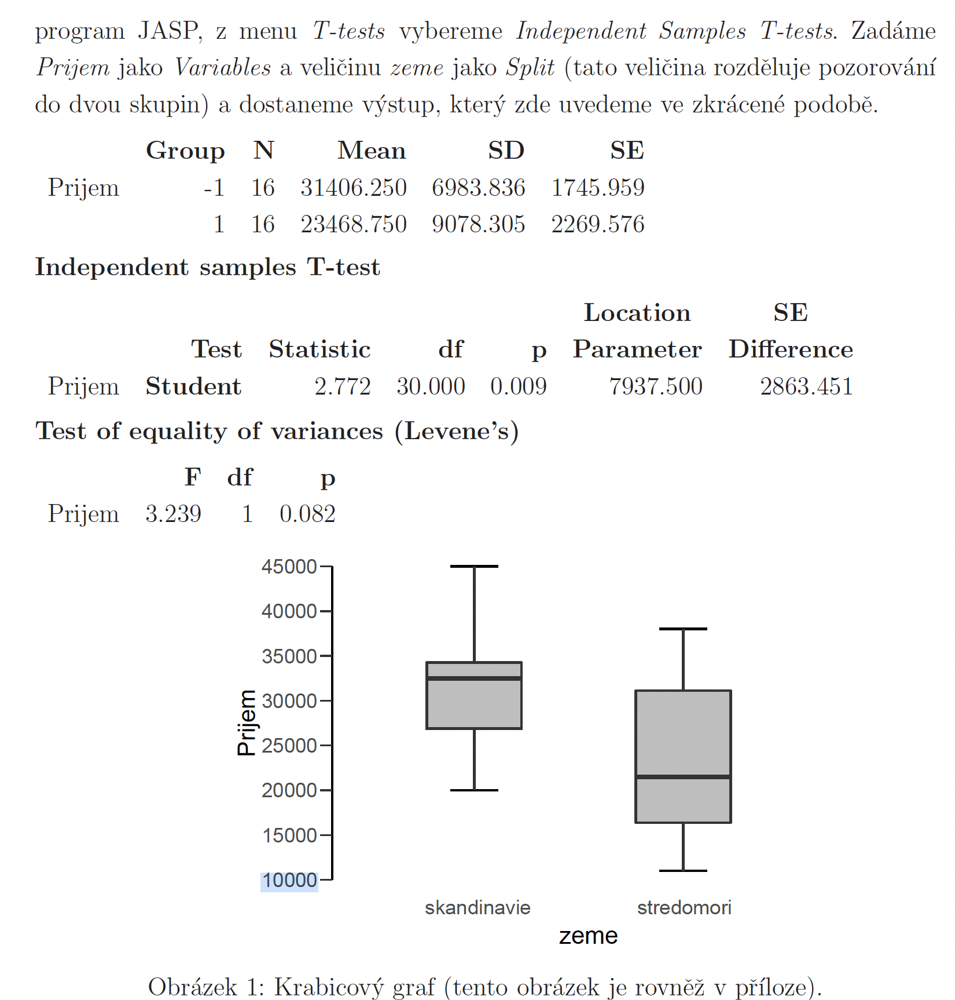
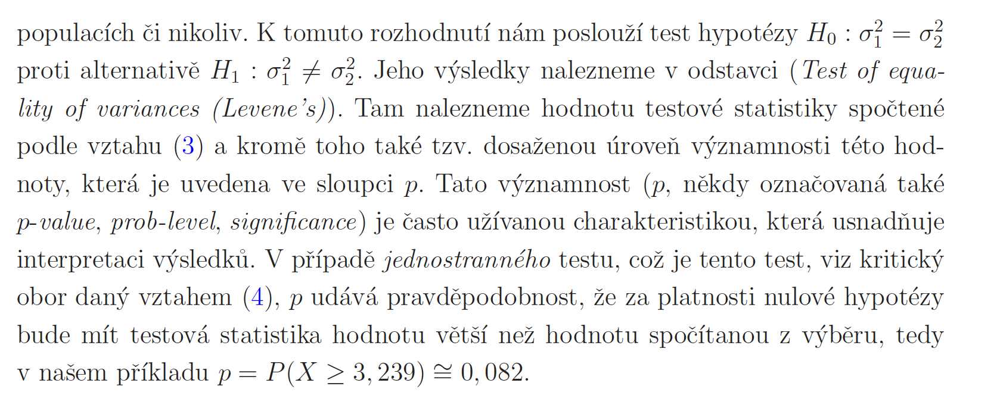

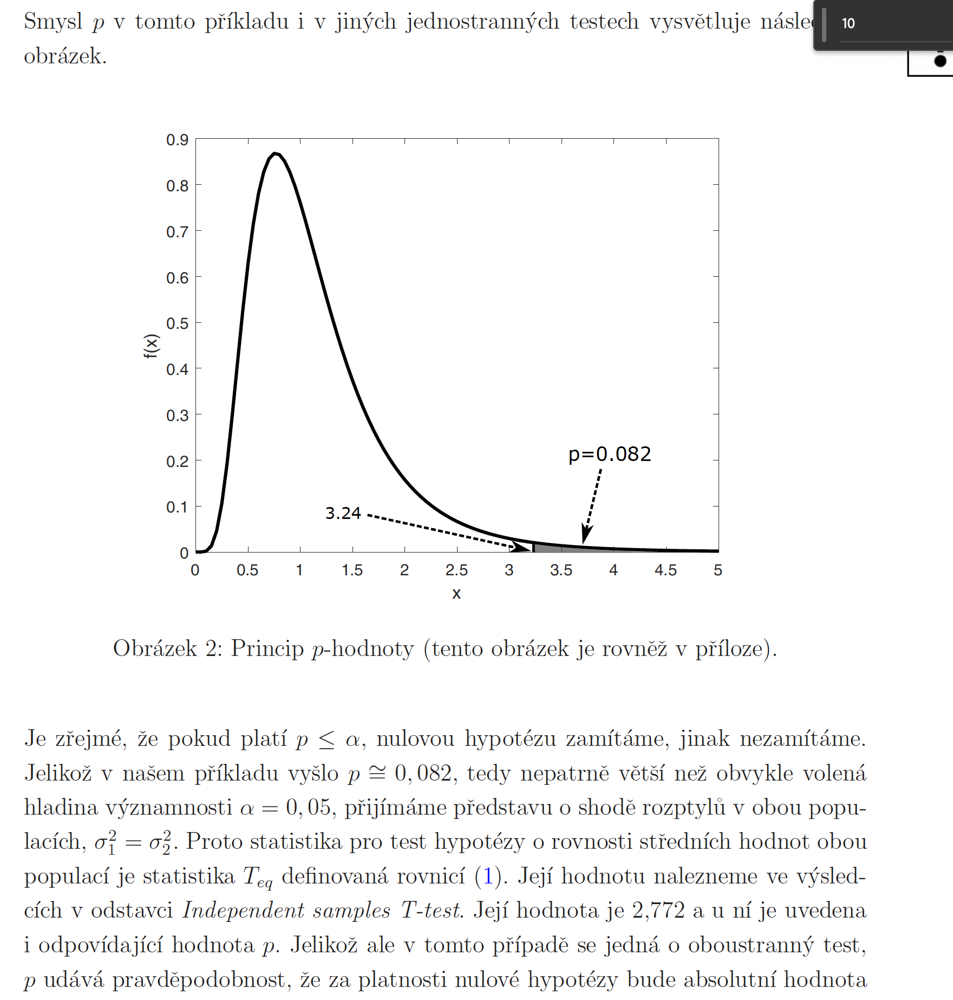
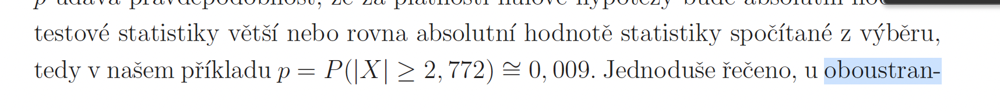
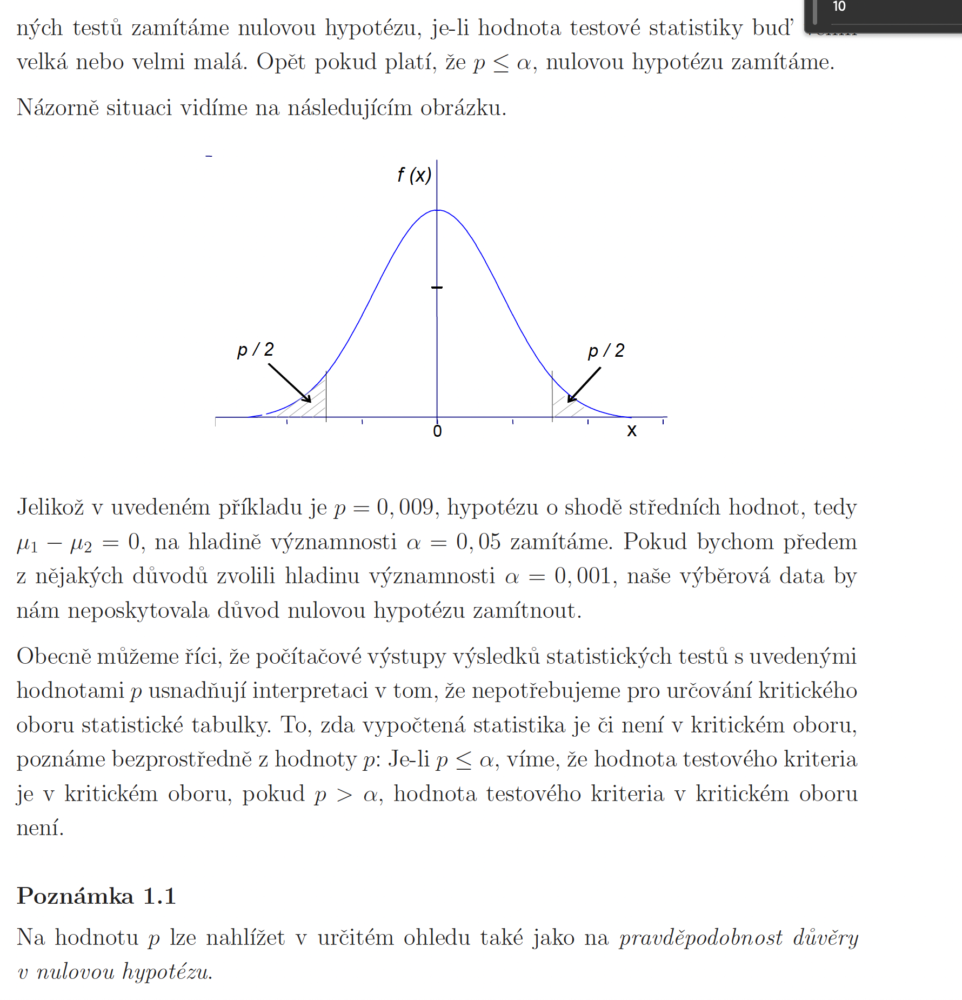


## Review

Kontolní otázky:
* Proč jsou testy o parametrech rozhodováním v nejistotě?
* Vysvětlete rozdíl mezi chybou prvního a druhého druhu.
* Proč je zamítnutí nulové hypotézy pro praktické rozhodování užitečnější výsledek než nezamítnutí nulové hypotézy?
* Kdy můžeme formulovat jednostrannou alternativu? Jakou nám to pak přináší výhodu?

* Proč jsou testy o parametrech rozhodováním v nejistotě?
* Vysvětlete rozdíl mezi chybou prvního a druhého druhu.
--- 
Intuícia: Predstav si, že chceš zistiť priemernú výšku všetkých Slovákov. Nemôžeš zmerať všetkých 5,5 milióna ľudí (populáciu). Zmeriaš len 1000 ľudí (výber). Vždy existuje riziko, že si náhodou vybral len basketbalistov. Preto nikdy nevieme výsledok na 100 %, ale len s určitou pravdepodobnosťou.

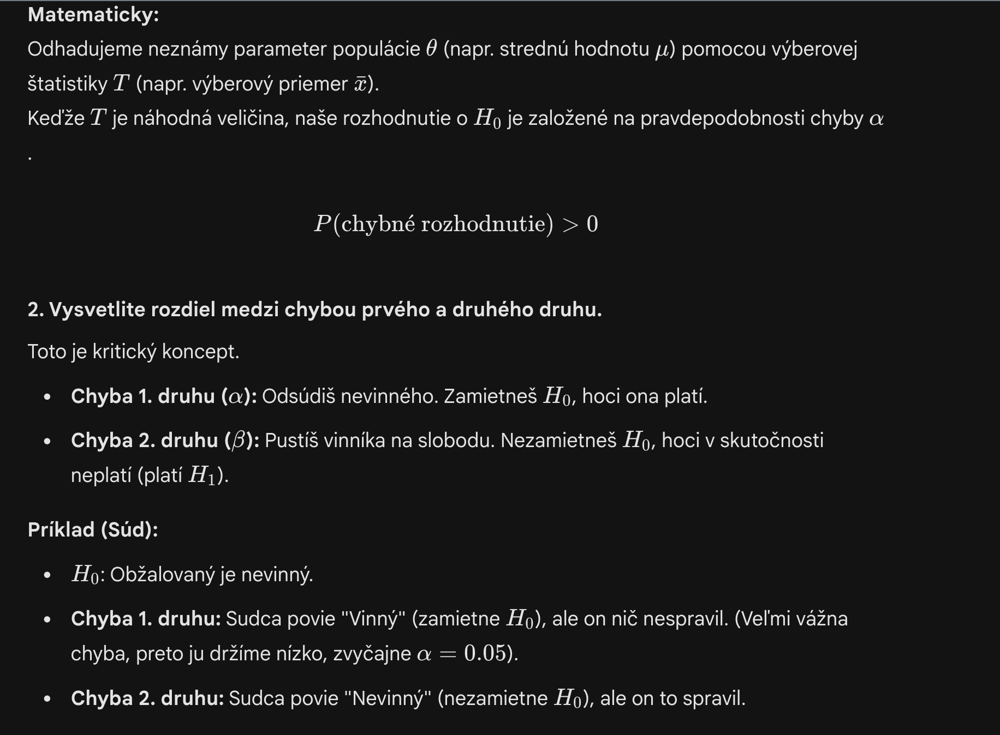

* Proč je zamítnutí nulové hypotézy pro praktické rozhodování užitečnější výsledek než nezamítnutí nulové hypotézy?
---
Testovanie hypotéz je ako "dôkaz sporom". $H_0$ je status quo (nič sa nedeje). Ak $H_0$ zamietneme, našli sme silný dôkaz, že sa "niečo deje" (liek funguje, stroj je pokazený).
Ak $H_0$ nezamietneme, neznamená to, že $H_0$ je pravda. Znamená to len, že nemáme dosť dôkazov.

Príklad:Hľadáš v lese čierne labute ($H_1$), aby si vyvrátil tvrdenie, že všetky labute sú biele ($H_0$).Ak nájdeš čiernu labuť $\rightarrow$ Zamietneš $H_0$. (Objav!)Ak nenájdeš čiernu labuť $\rightarrow$ Iba povieš "zatiaľ som nenašiel dôkaz o opaku". Nedokázal si, že neexistujú.

* Kdy můžeme formulovat jednostrannou alternativu? Jakou nám to pak přináší výhodu?
---
  Kedy: Keď nás zaujíma zmena len **jedným smerom a opačná zmena je pre nás bezpredmetná** alebo nemožná.$H_1: \mu > \mu_0$ (Chceme dokázať, že nový liek je lepší).$H_1: \mu < \mu_0$ (Chceme dokázať, že nová metóda znižuje chybovosť).
  * Výhoda:**Zvyšuje sa sila testu** ($1-\beta$). Celú hladinu významnosti $\alpha$ (napr. 5 %) sústredíme na jednu stranu rozdelenia. To znamená, že nám **stačí menšia odchýlka v dátach na to, aby sme zamietli** $H_0$. "Ľahšie" dokážeme to, čo chceme, ale musíme si byť istí smerom.

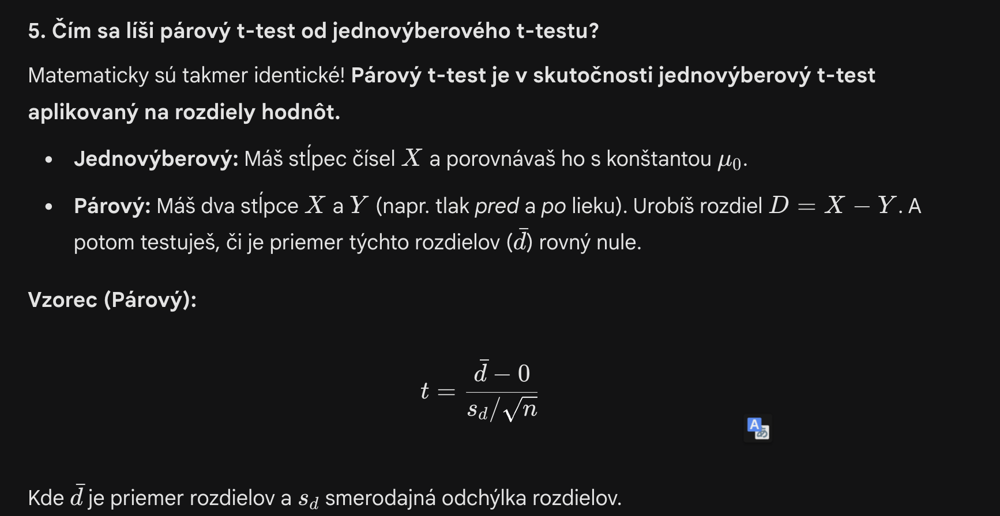


### Pojmy na zapamatanie si

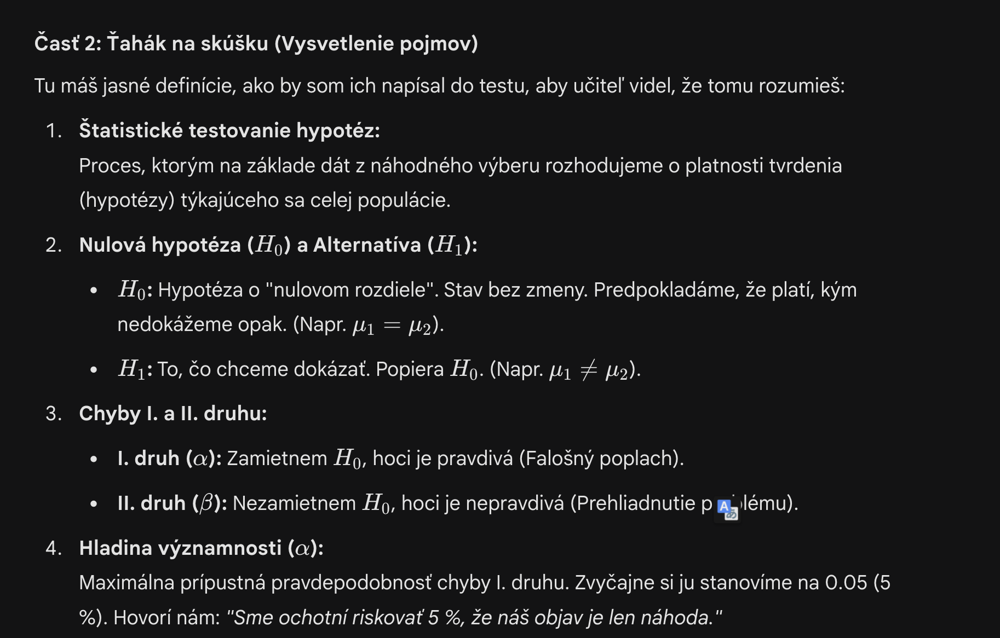
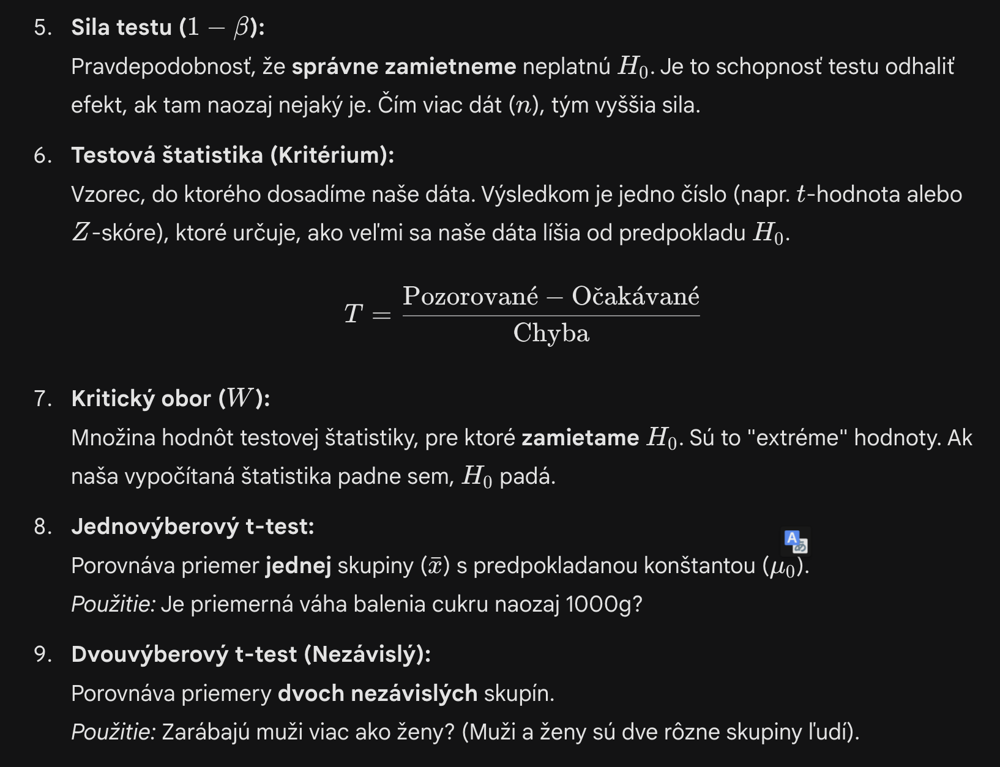
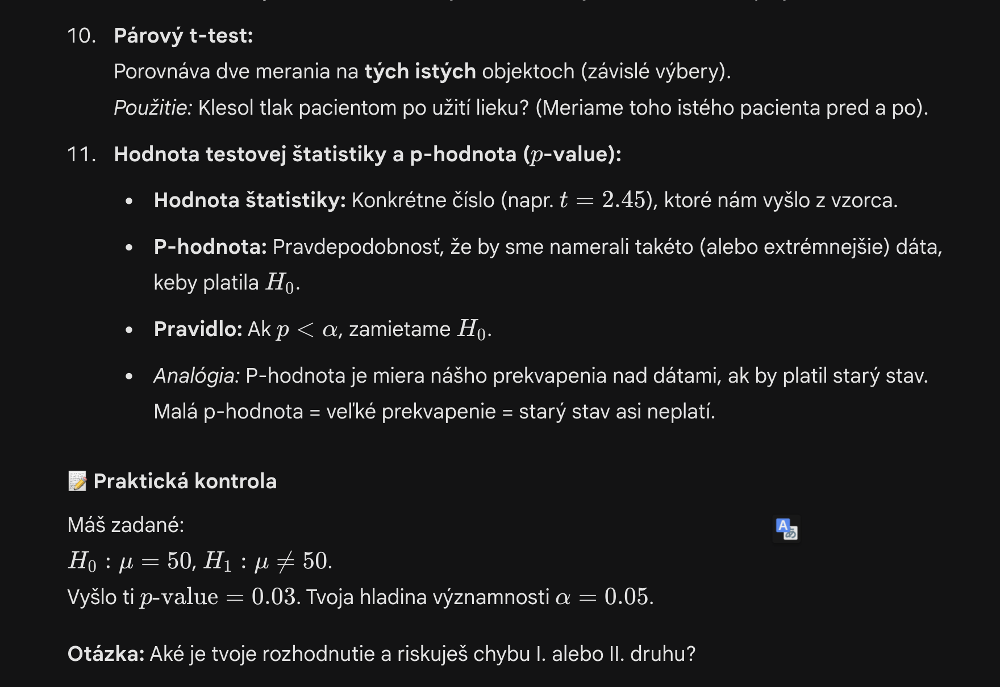

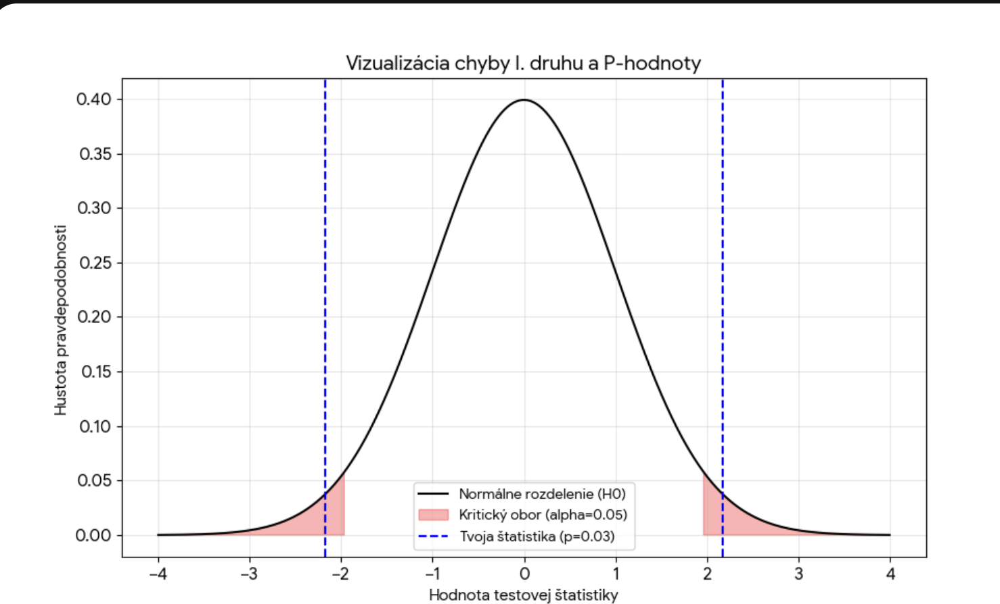

Tvoja veta "riskujem chybu 1. druhu" je kľúčová.
V štatistike nikdy nevieme na 100 %, či $H_0$ platí alebo nie. Vieme len, že ak by $H_0$ platila, takáto hodnota by sa vyskytla len v 3 % prípadov ($p=0.03$).
Preto si povieme: "To je príliš malá pravdepodobnosť na náhodu. Radšej budem riskovať, že sa mýlim (chyba 1. druhu), a $H_0$ zamietnem."